In [25]:
import Pkg

required_pkgs = ["CSV", "DataFrames", "Plots"]

for pkg_name in required_pkgs
    if Base.find_package(pkg_name) === nothing
        println("Installing $(pkg_name)...")
        Pkg.add(pkg_name)
    end
end

println("Package check complete.")

Package check complete.


# Treated CoCulture: Data Load + Initial Plots

This notebook currently does two things:
1. Loads all treated coculture CSVs
2. Creates quick exploratory plots of cell area vs day

In [26]:
using CSV
using DataFrames
using Statistics
using Random
using Printf
using Plots

function find_project_root(start::AbstractString = pwd())
    current = abspath(start)
    while true
        if isdir(joinpath(current, "Datasets")) || isdir(joinpath(current, "Processed_Datasets"))
            return current
        end
        parent = dirname(current)
        if parent == current
            return abspath(start)
        end
        current = parent
    end
end

project_root = find_project_root()
processed_dir = joinpath(project_root, "Processed_Datasets", "Treated Coculture")
raw_dir = joinpath(project_root, "Datasets", "Treated Coculture")
data_dir = isdir(processed_dir) ? processed_dir : raw_dir

csv_files = sort(filter(path -> endswith(lowercase(path), ".csv"), readdir(data_dir; join=true)))
isempty(csv_files) && error("No CSV files found in $(data_dir)")

frames = DataFrame[]
for file_path in csv_files
    temp = CSV.read(file_path, DataFrame)

    if !("Image" in names(temp))
        continue
    end

    area_col_candidates = filter(c -> c != "Image", names(temp))
    isempty(area_col_candidates) && continue

    area_col = area_col_candidates[1]
    rename!(temp, area_col => "cell_area_um2")

    fname = basename(file_path)
    mix_match = match(r"measure_(\d+-\d+)", fname)
    mix_value = isnothing(mix_match) ? "unknown" : mix_match.captures[1]
    cell_line_value = occursin("cis", lowercase(fname)) ? "A2780cis" : "A2780"

    temp.mix = fill(mix_value, nrow(temp))
    temp.cell_line = fill(cell_line_value, nrow(temp))
    temp.source_file = fill(fname, nrow(temp))

    day_values = Vector{Union{Missing, Int}}(undef, nrow(temp))
    for (i, img) in enumerate(temp.Image)
        day_match = match(r"Day(\d+)", String(img))
        day_values[i] = isnothing(day_match) ? missing : parse(Int, day_match.captures[1])
    end
    temp.day = day_values

    select!(temp, ["Image", "cell_area_um2", "day", "mix", "cell_line", "source_file"])
    push!(frames, temp)
end

df = vcat(frames...; cols=:union)
dropmissing!(df, [:day, :cell_area_um2])
transform!(df, :day => ByRow(Int) => :day)
sort!(df, [:mix, :cell_line, :day])

loaded_files = DataFrame(loaded_files = basename.(csv_files))
display(loaded_files)
display(first(df, min(5, nrow(df))))

println(@sprintf("Rows loaded: %d", nrow(df)))
println("Data directory: " * data_dir)

Row,loaded_files
,String
1,averages_generation_summary.csv
2,cis_split_summary.csv
3,day_averages_generation_summary.csv
4,measure_25-75A2780IC50tre1uM_2000Thres.csv
5,measure_25-75A2780cisIC50tre1uM_5000Thres.csv
6,measure_50-50A2780IC50tre1uM_2000Thres.csv
7,measure_50-50A2780cisIC50tre1uM_5000Thres.csv
8,measure_75-25A2780IC50tre1uM_2000Thres.csv
9,measure_75-25A2780cisIC50tre1uM_5000Thres.csv


Row,Image,cell_area_um2,day,mix,cell_line,source_file
,String,Float64,Int64,SubStrin…,String,String
1,25-75_A2780_20and30_IC50treat_Day1_TXR_Tile-0_A3.tif,44.0972,1,25-75,A2780,measure_25-75A2780IC50tre1uM_2000Thres.csv
2,25-75_A2780_20and30_IC50treat_Day1_TXR_Tile-0_A6.tif,156.033,1,25-75,A2780,measure_25-75A2780IC50tre1uM_2000Thres.csv
3,25-75_A2780_20and30_IC50treat_Day1_TXR_Tile-0_B3.tif,46.8271,1,25-75,A2780,measure_25-75A2780IC50tre1uM_2000Thres.csv
4,25-75_A2780_20and30_IC50treat_Day1_TXR_Tile-0_B6.tif,76.5931,1,25-75,A2780,measure_25-75A2780IC50tre1uM_2000Thres.csv
5,25-75_A2780_20and30_IC50treat_Day1_TXR_Tile-0_C3.tif,118.433,1,25-75,A2780,measure_25-75A2780IC50tre1uM_2000Thres.csv


Rows loaded: 3024
Data directory: /home/kadin/Desktop/Research/CancerGrowthDynamics/Processed_Datasets/Treated Coculture


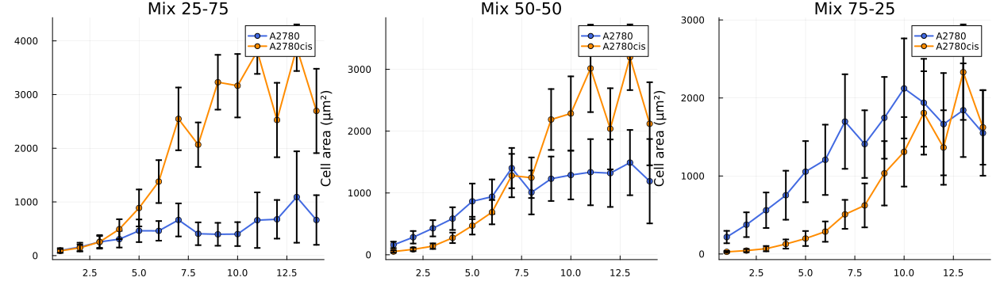

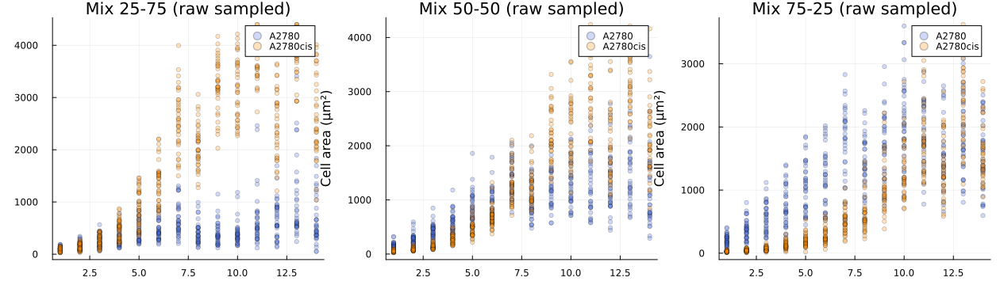

Row,mix,cell_line,day,mean_area_um2,sd_area_um2,n
,SubStrin…,String,Int64,Float64,Float64,Int64
1,25-75,A2780,1,95.9549,42.7741,36
2,25-75,A2780,2,159.292,80.2819,36
3,25-75,A2780,3,255.367,125.989,36
4,25-75,A2780,4,306.363,155.94,36
5,25-75,A2780,5,462.838,211.198,36
6,25-75,A2780,6,461.093,182.743,36
7,25-75,A2780,7,664.687,307.282,36
8,25-75,A2780,8,407.227,212.624,36
9,25-75,A2780,9,397.279,212.886,36


In [27]:
summary = combine(
    groupby(df, [:mix, :cell_line, :day]),
    :cell_area_um2 => mean => :mean_area_um2,
    :cell_area_um2 => std => :sd_area_um2,
    nrow => :n
)

mixes = sort(unique(summary.mix))
line_palette = [:royalblue, :darkorange]

plt1 = plot(
    layout = (1, length(mixes)),
    size = (420 * max(length(mixes), 1), 360),
    legend = :topright
)

for (idx, mix_value) in enumerate(mixes)
    s_mix = filter(:mix => ==(mix_value), summary)
    lines = sort(unique(s_mix.cell_line))
    for (j, line) in enumerate(lines)
        t = filter(:cell_line => ==(line), s_mix)
        sort!(t, :day)
        yerr = coalesce.(t.sd_area_um2, 0.0)
        plot!(
            plt1[idx],
            t.day,
            t.mean_area_um2;
            yerror = yerr,
            marker = :circle,
            linewidth = 2,
            color = line_palette[min(j, length(line_palette))],
            label = line
        )
    end
    title!(plt1[idx], "Mix $(mix_value)")
    xlabel!(plt1[idx], "Day")
    ylabel!(plt1[idx], "Cell area (μm²)")
end

display(plt1)

sample_n = min(3000, nrow(df))
sample_idx = sample_n < nrow(df) ? randperm(nrow(df))[1:sample_n] : collect(1:nrow(df))
df_plot = df[sample_idx, :]

plt2 = plot(
    layout = (1, length(mixes)),
    size = (420 * max(length(mixes), 1), 360),
    legend = :topright
)

for (idx, mix_value) in enumerate(mixes)
    d_mix = filter(:mix => ==(mix_value), df_plot)
    lines = sort(unique(d_mix.cell_line))
    for (j, line) in enumerate(lines)
        t = filter(:cell_line => ==(line), d_mix)
        scatter!(
            plt2[idx],
            t.day,
            t.cell_area_um2;
            markersize = 3,
            markeralpha = 0.25,
            color = line_palette[min(j, length(line_palette))],
            label = line
        )
    end
    title!(plt2[idx], "Mix $(mix_value) (raw sampled)")
    xlabel!(plt2[idx], "Day")
    ylabel!(plt2[idx], "Cell area (μm²)")
end

display(plt2)
display(first(summary, min(12, nrow(summary))))

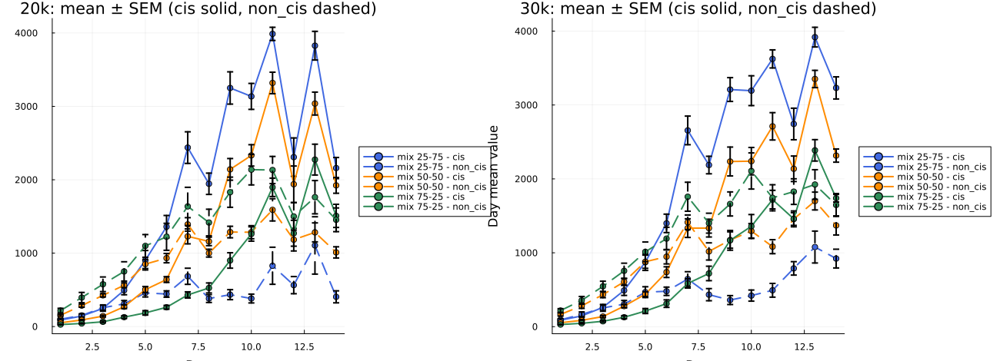

Row,density,cis_status,mix,Day,day_mean_value,day_sem,n_wells
,String,String,SubStrin…,Int64,Float64,Float64,Int64
1,20k,cis,25-75,1,88.59,10.9283,6
2,20k,cis,25-75,2,143.34,24.8366,6
3,20k,cis,25-75,3,247.63,39.1541,6
4,20k,cis,25-75,4,494.31,61.0279,6
5,20k,cis,25-75,5,903.37,132.682,6
6,20k,cis,25-75,6,1360.1,153.029,6
7,20k,cis,25-75,7,2438.38,215.24,6
8,20k,cis,25-75,8,1945.32,144.947,6
9,20k,cis,25-75,9,3250.29,219.801,6


In [28]:
# Cell 5: Processed day-averages with error bars; cis and non_cis together per density
using CSV
using DataFrames
using Statistics
using Plots

if !isdefined(Main, :find_project_root)
    function find_project_root(start::AbstractString = pwd())
        current = abspath(start)
        while true
            if isdir(joinpath(current, "Datasets")) || isdir(joinpath(current, "Processed_Datasets"))
                return current
            end
            parent = dirname(current)
            if parent == current
                return abspath(start)
            end
            current = parent
        end
    end
end

base = joinpath(find_project_root(), "Processed_Datasets", "Treated Coculture")
densities = ["20k", "30k"]
states = ["cis", "non_cis"]

function extract_mix(fname::AbstractString)
    m = match(r"measure_(\d+-\d+)", fname)
    return isnothing(m) ? "unknown" : m.captures[1]
end

avg_frames = DataFrame[]
for density in densities, state in states
    avg_dir = joinpath(base, density, state, "Averages")
    if !isdir(avg_dir)
        continue
    end
    for f in sort(readdir(avg_dir; join=true))
        bn = basename(f)
        if !endswith(lowercase(bn), "_day_averages.csv") || startswith(lowercase(bn), "combined")
            continue
        end

        t = CSV.read(f, DataFrame)
        if !("Day" in names(t) && "day_mean_value" in names(t))
            continue
        end

        if !("day_sem" in names(t))
            t.day_sem = zeros(nrow(t))
        end
        if !("day_sd" in names(t))
            t.day_sd = zeros(nrow(t))
        end
        if !("n_wells" in names(t))
            t.n_wells = fill(missing, nrow(t))
        end

        t.density = fill(density, nrow(t))
        t.cis_status = fill(state, nrow(t))
        t.source_file = fill(replace(bn, "_day_averages.csv" => ".csv"), nrow(t))
        t.mix = fill(extract_mix(bn), nrow(t))
        push!(avg_frames, t)
    end
end

avg_df = isempty(avg_frames) ? DataFrame() : vcat(avg_frames...; cols=:union)
isempty(avg_df) && error("No day_averages files found under Processed_Datasets/Treated Coculture/*/*/Averages")
sort!(avg_df, [:density, :mix, :cis_status, :Day])

mix_levels = sort(unique(avg_df.mix))
mix_palette = [:royalblue, :darkorange, :seagreen]
mix_color = Dict(mix => mix_palette[min(i, length(mix_palette))] for (i, mix) in enumerate(mix_levels))
state_style = Dict("cis" => :solid, "non_cis" => :dash)

plt_avg = plot(layout=(1, 2), size=(1300, 470), legend=:outerright)
for (idx, density) in enumerate(densities)
    sub = filter(:density => ==(density), avg_df)
    if nrow(sub) == 0
        title!(plt_avg[idx], "$(density) (no data)")
        continue
    end

    for mix in sort(unique(sub.mix)), state in states
        s = filter(r -> r.mix == mix && r.cis_status == state, sub)
        if nrow(s) == 0
            continue
        end
        sort!(s, :Day)
        yerr = coalesce.(s.day_sem, 0.0)
        plot!(
            plt_avg[idx],
            s.Day,
            s.day_mean_value;
            yerror = yerr,
            marker = :circle,
            linewidth = 2,
            linestyle = state_style[state],
            color = mix_color[mix],
            label = "mix $(mix) - $(state)"
        )
    end

    title!(plt_avg[idx], "$(density): mean ± SEM (cis solid, non_cis dashed)")
    xlabel!(plt_avg[idx], "Day")
    ylabel!(plt_avg[idx], "Day mean value")
end

display(plt_avg)
display(first(avg_df[:, [:density, :cis_status, :mix, :Day, :day_mean_value, :day_sem, :n_wells]], min(16, nrow(avg_df))))

Transfer-fit summary on treated IC50 coculture:


Row,density,mix,model,RMSE_S,RMSE_R,RMSE_total,R2_S,R2_R,R2_total
,String,String,String,Float64,Float64,Float64,Float64,Float64,Float64
1,20k,25-75,option1_transfer,2572.08,1821.08,1172.12,-99.8501,-0.910833,0.413212
2,20k,25-75,option2_transfer,521.763,1509.85,2003.34,-3.15005,-0.313507,-0.714121
3,20k,50-50,option1_transfer,2321.13,1626.6,1222.91,-29.0082,-1.29152,0.296798
4,20k,50-50,option2_transfer,2284.31,1712.17,1024.81,-28.0639,-1.53895,0.506167
5,20k,75-25,option1_transfer,2070.6,1026.49,1433.26,-11.1363,-1.00617,-0.328978
6,20k,75-25,option2_transfer,2098.64,1057.34,1419.74,-11.4673,-1.12856,-0.304019
7,30k,25-75,option1_transfer,2338.98,1492.81,999.898,-73.8674,-0.210632,0.593459
8,30k,25-75,option2_transfer,561.702,1492.57,2008.52,-3.31768,-0.210244,-0.640383
9,30k,50-50,option1_transfer,2225.56,1656.57,1082.14,-23.4784,-1.38987,0.465642


Row,density,mix,model,RMSE_S,R2_S
,String,String,String,Float64,Float64
1,20k,25-75,option2_transfer,521.763,-3.15005
2,20k,50-50,option2_transfer,2284.31,-28.0639
3,20k,75-25,option1_transfer,2070.6,-11.1363
4,30k,25-75,option2_transfer,561.702,-3.31768
5,30k,50-50,option2_transfer,2200.55,-22.9314
6,30k,75-25,option1_transfer,1996.43,-10.1448


Row,density,mix,model,RMSE_R,R2_R
,String,String,String,Float64,Float64
1,20k,25-75,option2_transfer,1509.85,-0.313507
2,20k,50-50,option1_transfer,1626.6,-1.29152
3,20k,75-25,option1_transfer,1026.49,-1.00617
4,30k,25-75,option2_transfer,1492.57,-0.210244
5,30k,50-50,option1_transfer,1656.57,-1.38987
6,30k,75-25,option1_transfer,1098.81,-1.14802


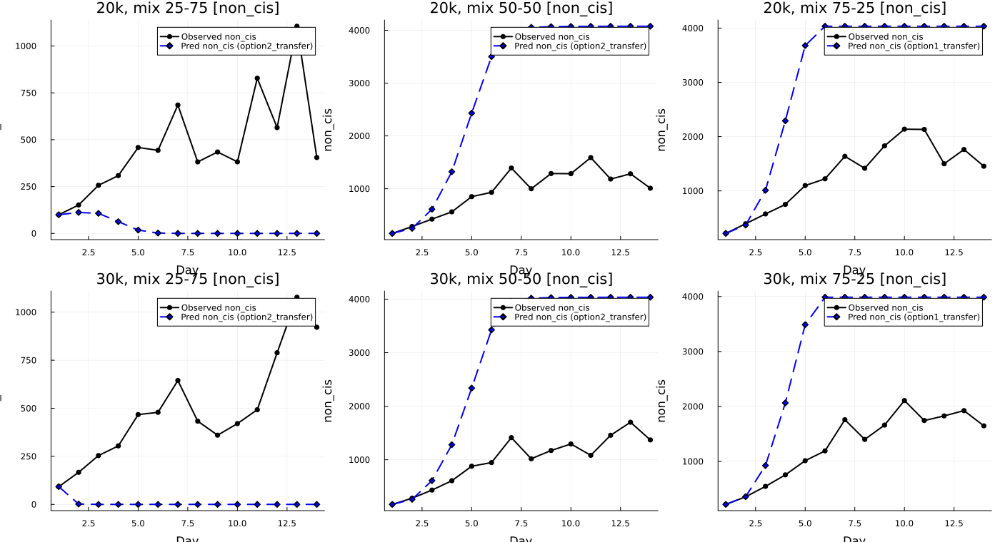

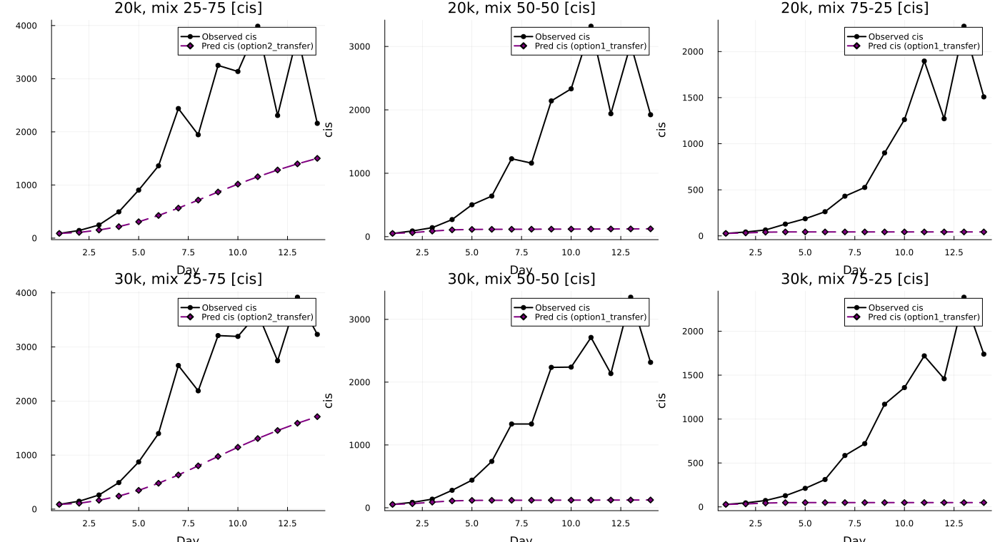

In [29]:
# Transfer test: previous coculture parameters on treated IC50 coculture (evaluate non_cis and cis separately)
using CSV
using DataFrames
using Statistics
using Plots

project_root = find_project_root()

mono_param_path = joinpath(project_root, "Modeling_Approaches/01_mechanical_manual", "Untreated MonoCulture", "outputs", "csv", "untreated_monoculture_logistic_parameters.csv")
opt1_path = joinpath(project_root, "Modeling_Approaches/01_mechanical_manual", "SimpleModels", "coculture_option1_params.csv")
opt2_path = joinpath(project_root, "Modeling_Approaches/01_mechanical_manual", "SimpleModels", "coculture_option2_params.csv")
treated_root = joinpath(project_root, "Processed_Datasets", "Treated Coculture")

mono = CSV.read(mono_param_path, DataFrame)
opt1 = CSV.read(opt1_path, DataFrame)
opt2 = CSV.read(opt2_path, DataFrame)

function get_mono_params(mono::DataFrame, density::String)
    na = mono[(mono.Density .== density) .& (mono.CellLine .== "A2780Naive"), :]
    ci = mono[(mono.Density .== density) .& (mono.CellLine .== "A2780cis"), :]
    nrow(na) == 0 && error("Missing A2780Naive monoculture params for $(density)")
    nrow(ci) == 0 && error("Missing A2780cis monoculture params for $(density)")
    return (
        rS = Float64(na.r[1]), KS = Float64(na.K[1]), vS = Float64(na.v[1]),
        rR = Float64(ci.r[1]), KR = Float64(ci.K[1]), vR = Float64(ci.v[1])
    )
end

function load_treated_pair(root::String, density::String, mix::String)
    cis_dir = joinpath(root, density, "cis", "Averages")
    non_dir = joinpath(root, density, "non_cis", "Averages")
    cis_file = joinpath(cis_dir, "measure_$(mix)A2780cisIC50tre1uM_5000Thres_day_averages.csv")
    non_file = joinpath(non_dir, "measure_$(mix)A2780IC50tre1uM_2000Thres_day_averages.csv")
    isfile(cis_file) || error("Missing file: $(cis_file)")
    isfile(non_file) || error("Missing file: $(non_file)")

    c = CSV.read(cis_file, DataFrame)
    n = CSV.read(non_file, DataFrame)

    rename!(c, :day_mean_value => :R_obs)
    rename!(n, :day_mean_value => :S_obs)

    d = innerjoin(n[:, [:Day, :S_obs]], c[:, [:Day, :R_obs]], on=:Day)
    sort!(d, :Day)
    return d
end

function clamp_pow(base::Float64, v::Float64)
    return max(base, 0.0)^v
end

function step_opt1(S::Float64, R::Float64, p, dt::Float64)
    αSR = clamp(p.αSR, 0.0, 1.0)
    αRS = clamp(p.αRS, 0.0, 1.0)
    gS = p.rS * S * clamp_pow(1.0 - (S + αSR * R) / p.KS, p.vS)
    gR = p.rR * R * clamp_pow(1.0 - (αRS * S + R) / p.KR, p.vR)
    S2 = max(S + dt * gS, 0.0)
    R2 = max(R + dt * gR, 0.0)
    return S2, R2
end

function step_opt2(S::Float64, R::Float64, p, dt::Float64)
    αSR = clamp(p.αSR, 0.0, 1.0)
    αRS = clamp(p.αRS, 0.0, 1.0)
    γ = max(p.γ, 0.0)
    δ = max(p.δ, 0.0)
    gS = p.rS * S * clamp_pow(1.0 - (S + γ * R) / p.KS, p.vS) - αSR * S * R
    gR = p.rR * R * clamp_pow(1.0 - (δ * S + R) / p.KR, p.vR) - αRS * S * R
    S2 = max(S + dt * gS, 0.0)
    R2 = max(R + dt * gR, 0.0)
    return S2, R2
end

function simulate_days(stepper, p, days::Vector{Int}, S0::Float64, R0::Float64; dt=0.02)
    max_day = maximum(days)
    t = 1.0
    S, R = S0, R0
    out = Dict{Int, Tuple{Float64,Float64}}(1 => (S0, R0))
    while t < max_day
        S, R = stepper(S, R, p, dt)
        t += dt
        d_round = Int(round(t))
        if d_round in days && !haskey(out, d_round)
            out[d_round] = (S, R)
        end
    end
    for d in days
        if !haskey(out, d)
            out[d] = (S, R)
        end
    end
    S_hat = [out[d][1] for d in days]
    R_hat = [out[d][2] for d in days]
    return S_hat, R_hat
end

function rmse(y, yhat)
    return sqrt(mean((y .- yhat).^2))
end

function r2(y, yhat)
    ss_res = sum((y .- yhat).^2)
    ss_tot = sum((y .- mean(y)).^2)
    return ss_tot == 0 ? NaN : 1.0 - ss_res / ss_tot
end

mixes = ["25-75", "50-50", "75-25"]
densities = ["20k", "30k"]

rows = DataFrame(density=String[], mix=String[], model=String[], RMSE_S=Float64[], RMSE_R=Float64[], RMSE_total=Float64[], R2_S=Float64[], R2_R=Float64[], R2_total=Float64[])
plot_rows = DataFrame()

for density in densities, mix in mixes
    obs = load_treated_pair(treated_root, density, mix)
    days = Int.(obs.Day)
    S_obs = Float64.(obs.S_obs)
    R_obs = Float64.(obs.R_obs)
    T_obs = S_obs .+ R_obs

    mono_p = get_mono_params(mono, density)

    r1 = opt1[(opt1.density .== density) .& (opt1.mix_label .== mix), :]
    if nrow(r1) > 0
        p1 = (
            rS = mono_p.rS, KS = mono_p.KS, vS = mono_p.vS,
            rR = mono_p.rR, KR = mono_p.KR, vR = mono_p.vR,
            αSR = Float64(r1.αSR[1]), αRS = Float64(r1.αRS[1])
        )
        S_hat, R_hat = simulate_days(step_opt1, p1, days, S_obs[1], R_obs[1])
        T_hat = S_hat .+ R_hat
        push!(rows, (density, mix, "option1_transfer", rmse(S_obs,S_hat), rmse(R_obs,R_hat), rmse(T_obs,T_hat), r2(S_obs,S_hat), r2(R_obs,R_hat), r2(T_obs,T_hat)))
        temp = DataFrame(density=fill(density,length(days)), mix=fill(mix,length(days)), model=fill("option1_transfer",length(days)), Day=days, S_obs=S_obs, R_obs=R_obs, S_hat=S_hat, R_hat=R_hat)
        append!(plot_rows, temp)
    end

    r2p = opt2[(opt2.density .== density) .& (opt2.mix_label .== mix), :]
    if nrow(r2p) > 0
        p2 = (
            rS = mono_p.rS, KS = mono_p.KS, vS = mono_p.vS,
            rR = mono_p.rR, KR = mono_p.KR, vR = mono_p.vR,
            αSR = Float64(r2p.αSR[1]), αRS = Float64(r2p.αRS[1]),
            γ = Float64(r2p.γ[1]), δ = Float64(r2p.δ[1])
        )
        S_hat, R_hat = simulate_days(step_opt2, p2, days, S_obs[1], R_obs[1])
        T_hat = S_hat .+ R_hat
        push!(rows, (density, mix, "option2_transfer", rmse(S_obs,S_hat), rmse(R_obs,R_hat), rmse(T_obs,T_hat), r2(S_obs,S_hat), r2(R_obs,R_hat), r2(T_obs,T_hat)))
        temp = DataFrame(density=fill(density,length(days)), mix=fill(mix,length(days)), model=fill("option2_transfer",length(days)), Day=days, S_obs=S_obs, R_obs=R_obs, S_hat=S_hat, R_hat=R_hat)
        append!(plot_rows, temp)
    end
end

println("Transfer-fit summary on treated IC50 coculture:")
display(sort(rows, [:density, :mix, :model]))

# Best by non_cis (S)
best_S_rows = combine(groupby(rows, [:density, :mix]), :RMSE_S => minimum => :best_rmse_S)
best_S = innerjoin(rows, best_S_rows, on=[:density, :mix])
best_S = best_S[best_S.RMSE_S .== best_S.best_rmse_S, :]
display(best_S[:, [:density, :mix, :model, :RMSE_S, :R2_S]])

# Best by cis (R)
best_R_rows = combine(groupby(rows, [:density, :mix]), :RMSE_R => minimum => :best_rmse_R)
best_R = innerjoin(rows, best_R_rows, on=[:density, :mix])
best_R = best_R[best_R.RMSE_R .== best_R.best_rmse_R, :]
display(best_R[:, [:density, :mix, :model, :RMSE_R, :R2_R]])

# Plot non_cis (S) using best-S model per panel
plt_S = plot(layout=(2,3), size=(1400,760), legend=:topright)
panel = 1
for density in densities, mix in mixes
    b = best_S[(best_S.density .== density) .& (best_S.mix .== mix), :]
    if nrow(b) == 0
        title!(plt_S[panel], "$(density), mix $(mix) (no model)")
        panel += 1
        continue
    end
    model_name = String(b.model[1])
    d = plot_rows[(plot_rows.density .== density) .& (plot_rows.mix .== mix) .& (plot_rows.model .== model_name), :]
    sort!(d, :Day)
    plot!(plt_S[panel], d.Day, d.S_obs; marker=:circle, linewidth=2, label="Observed non_cis", color=:black)
    plot!(plt_S[panel], d.Day, d.S_hat; marker=:diamond, linewidth=2, linestyle=:dash, label="Pred non_cis ($(model_name))", color=:blue)
    title!(plt_S[panel], "$(density), mix $(mix) [non_cis]")
    xlabel!(plt_S[panel], "Day")
    ylabel!(plt_S[panel], "non_cis")
    panel += 1
end
display(plt_S)

# Plot cis (R) using best-R model per panel
plt_R = plot(layout=(2,3), size=(1400,760), legend=:topright)
panel = 1
for density in densities, mix in mixes
    b = best_R[(best_R.density .== density) .& (best_R.mix .== mix), :]
    if nrow(b) == 0
        title!(plt_R[panel], "$(density), mix $(mix) (no model)")
        panel += 1
        continue
    end
    model_name = String(b.model[1])
    d = plot_rows[(plot_rows.density .== density) .& (plot_rows.mix .== mix) .& (plot_rows.model .== model_name), :]
    sort!(d, :Day)
    plot!(plt_R[panel], d.Day, d.R_obs; marker=:circle, linewidth=2, label="Observed cis", color=:black)
    plot!(plt_R[panel], d.Day, d.R_hat; marker=:diamond, linewidth=2, linestyle=:dash, label="Pred cis ($(model_name))", color=:purple)
    title!(plt_R[panel], "$(density), mix $(mix) [cis]")
    xlabel!(plt_R[panel], "Day")
    ylabel!(plt_R[panel], "cis")
    panel += 1
end
display(plt_R)

In [30]:
# Expanded transfer sweep: include all exported coculture model families + top-5 candidates
using CSV
using DataFrames
using Statistics

project_root = find_project_root()
mono_param_path = joinpath(project_root, "Modeling_Approaches/01_mechanical_manual", "Untreated MonoCulture", "untreated_monoculture_logistic_parameters.csv")
opt1_path = joinpath(project_root, "Modeling_Approaches/01_mechanical_manual", "SimpleModels", "coculture_option1_params.csv")
opt2_path = joinpath(project_root, "Modeling_Approaches/01_mechanical_manual", "SimpleModels", "coculture_option2_params.csv")
comp_path = joinpath(project_root, "Modeling_Approaches/01_mechanical_manual", "SimpleModels", "coculture_fit_params.csv")
treated_root = joinpath(project_root, "Processed_Datasets", "Treated Coculture")

mono = CSV.read(mono_param_path, DataFrame)
opt1 = CSV.read(opt1_path, DataFrame)
opt2 = CSV.read(opt2_path, DataFrame)
comp = CSV.read(comp_path, DataFrame)

function step_competing_sharedK(S::Float64, R::Float64, p, dt::Float64)
    α = clamp(p.α, 0.0, 2.0)
    β = clamp(p.β, 0.0, 2.0)
    K = max(p.K, 1.0)
    rs = max(p.rs, 0.0)
    rr = max(p.rr, 0.0)
    gS = rs * S * clamp_pow(1.0 - (S + α * R) / K, 1.0)
    gR = rr * R * clamp_pow(1.0 - (R + β * S) / K, 1.0)
    S2 = max(S + dt * gS, 0.0)
    R2 = max(R + dt * gR, 0.0)
    return S2, R2
end

densities = ["20k", "30k"]
mixes = ["25-75", "50-50", "75-25"]

rows_all = DataFrame(density=String[], mix=String[], model=String[], RMSE_S=Float64[], RMSE_R=Float64[], RMSE_total=Float64[], R2_S=Float64[], R2_R=Float64[], R2_total=Float64[])

for density in densities, mix in mixes
    obs = load_treated_pair(treated_root, density, mix)
    days = Int.(obs.Day)
    S_obs = Float64.(obs.S_obs)
    R_obs = Float64.(obs.R_obs)
    T_obs = S_obs .+ R_obs

    mono_p = get_mono_params(mono, density)

    r1 = opt1[(opt1.density .== density) .& (opt1.mix_label .== mix), :]
    if nrow(r1) > 0
        p1 = (
            rS = mono_p.rS, KS = mono_p.KS, vS = mono_p.vS,
            rR = mono_p.rR, KR = mono_p.KR, vR = mono_p.vR,
            αSR = Float64(r1.αSR[1]), αRS = Float64(r1.αRS[1])
        )
        S_hat, R_hat = simulate_days(step_opt1, p1, days, S_obs[1], R_obs[1])
        T_hat = S_hat .+ R_hat
        push!(rows_all, (density, mix, "option1_transfer", rmse(S_obs,S_hat), rmse(R_obs,R_hat), rmse(T_obs,T_hat), r2(S_obs,S_hat), r2(R_obs,R_hat), r2(T_obs,T_hat)))
    end

    r2p = opt2[(opt2.density .== density) .& (opt2.mix_label .== mix), :]
    if nrow(r2p) > 0
        p2 = (
            rS = mono_p.rS, KS = mono_p.KS, vS = mono_p.vS,
            rR = mono_p.rR, KR = mono_p.KR, vR = mono_p.vR,
            αSR = Float64(r2p.αSR[1]), αRS = Float64(r2p.αRS[1]),
            γ = Float64(r2p.γ[1]), δ = Float64(r2p.δ[1])
        )
        S_hat, R_hat = simulate_days(step_opt2, p2, days, S_obs[1], R_obs[1])
        T_hat = S_hat .+ R_hat
        push!(rows_all, (density, mix, "option2_transfer", rmse(S_obs,S_hat), rmse(R_obs,R_hat), rmse(T_obs,T_hat), r2(S_obs,S_hat), r2(R_obs,R_hat), r2(T_obs,T_hat)))
    end

    rc = comp[(comp.density .== density) .& (comp.mix_label .== mix), :]
    if nrow(rc) > 0
        pc = (
            rs = Float64(rc.rs[1]), rr = Float64(rc.rr[1]),
            K = Float64(rc.K[1]), α = Float64(rc.α[1]), β = Float64(rc.β[1])
        )
        S_hat, R_hat = simulate_days(step_competing_sharedK, pc, days, S_obs[1], R_obs[1])
        T_hat = S_hat .+ R_hat
        push!(rows_all, (density, mix, "competing_transfer", rmse(S_obs,S_hat), rmse(R_obs,R_hat), rmse(T_obs,T_hat), r2(S_obs,S_hat), r2(R_obs,R_hat), r2(T_obs,T_hat)))
    end
end

println("Expanded transfer-fit summary (all exported model families):")
display(sort(rows_all, [:density, :mix, :RMSE_total]))

best_S = combine(groupby(rows_all, [:density, :mix]), :RMSE_S => minimum => :best_rmse_S)
best_S = innerjoin(rows_all, best_S, on=[:density, :mix])
best_S = sort(best_S[best_S.RMSE_S .== best_S.best_rmse_S, [:density, :mix, :model, :RMSE_S, :R2_S]], [:density, :mix])
println("\nBest per condition for non_cis (S):")
display(best_S)

best_R = combine(groupby(rows_all, [:density, :mix]), :RMSE_R => minimum => :best_rmse_R)
best_R = innerjoin(rows_all, best_R, on=[:density, :mix])
best_R = sort(best_R[best_R.RMSE_R .== best_R.best_rmse_R, [:density, :mix, :model, :RMSE_R, :R2_R]], [:density, :mix])
println("\nBest per condition for cis (R):")
display(best_R)

topN = min(5, nrow(rows_all))
println("\nTop $(topN) transfer candidates by non_cis RMSE (global):")
display(first(sort(rows_all, :RMSE_S), topN)[:, [:density, :mix, :model, :RMSE_S, :R2_S]])

println("\nTop $(topN) transfer candidates by cis RMSE (global):")
display(first(sort(rows_all, :RMSE_R), topN)[:, [:density, :mix, :model, :RMSE_R, :R2_R]])

println("\nTop $(topN) transfer candidates by total RMSE (global):")
display(first(sort(rows_all, :RMSE_total), topN)[:, [:density, :mix, :model, :RMSE_total, :R2_total]])

Expanded transfer-fit summary (all exported model families):

Best per condition for non_cis (S):

Best per condition for cis (R):

Top 5 transfer candidates by non_cis RMSE (global):

Top 5 transfer candidates by cis RMSE (global):

Top 5 transfer candidates by total RMSE (global):


Row,density,mix,model,RMSE_S,RMSE_R,RMSE_total,R2_S,R2_R,R2_total
,String,String,String,Float64,Float64,Float64,Float64,Float64,Float64
1,20k,25-75,option1_transfer,2572.08,1821.08,1172.12,-99.8501,-0.910833,0.413212
2,20k,25-75,option2_transfer,521.763,1509.85,2003.34,-3.15005,-0.313507,-0.714121
3,20k,25-75,competing_transfer,16262.4,22059.8,38205.4,-4030.58,-279.393,-622.424
4,20k,50-50,option2_transfer,2284.31,1712.17,1024.81,-28.0639,-1.53895,0.506167
5,20k,50-50,option1_transfer,2321.13,1626.6,1222.91,-29.0082,-1.29152,0.296798
6,20k,50-50,competing_transfer,2099.11,1662.91,1529.44,-23.5421,-1.39498,-0.099906
7,20k,75-25,option2_transfer,2098.64,1057.34,1419.74,-11.4673,-1.12856,-0.304019
8,20k,75-25,option1_transfer,2070.6,1026.49,1433.26,-11.1363,-1.00617,-0.328978
9,20k,75-25,competing_transfer,25060.1,85225.2,1.08853e5,-1776.71,-13828.0,-7664.63


Row,density,mix,model,RMSE_S,R2_S
,String,String,String,Float64,Float64
1,20k,25-75,option2_transfer,521.763,-3.15005
2,20k,50-50,competing_transfer,2099.11,-23.5421
3,20k,75-25,option1_transfer,2070.6,-11.1363
4,30k,25-75,option2_transfer,561.702,-3.31768
5,30k,50-50,option2_transfer,2200.55,-22.9314
6,30k,75-25,option1_transfer,1996.43,-10.1448


Row,density,mix,model,RMSE_R,R2_R
,String,String,String,Float64,Float64
1,20k,25-75,option2_transfer,1509.85,-0.313507
2,20k,50-50,option1_transfer,1626.6,-1.29152
3,20k,75-25,option1_transfer,1026.49,-1.00617
4,30k,25-75,option2_transfer,1492.57,-0.210244
5,30k,50-50,option1_transfer,1656.57,-1.38987
6,30k,75-25,option1_transfer,1098.81,-1.14802


Row,density,mix,model,RMSE_S,R2_S
,String,String,String,Float64,Float64
1,20k,25-75,option2_transfer,521.763,-3.15005
2,30k,25-75,option2_transfer,561.702,-3.31768
3,30k,75-25,option1_transfer,1996.43,-10.1448
4,30k,75-25,option2_transfer,2012.5,-10.3249
5,20k,75-25,option1_transfer,2070.6,-11.1363


Row,density,mix,model,RMSE_R,R2_R
,String,String,String,Float64,Float64
1,20k,75-25,option1_transfer,1026.49,-1.00617
2,20k,75-25,option2_transfer,1057.34,-1.12856
3,30k,75-25,option1_transfer,1098.81,-1.14802
4,30k,75-25,option2_transfer,1133.71,-1.28662
5,30k,25-75,option2_transfer,1492.57,-0.210244


Row,density,mix,model,RMSE_total,R2_total
,String,String,String,Float64,Float64
1,30k,50-50,option2_transfer,889.384,0.639053
2,30k,25-75,option1_transfer,999.898,0.593459
3,20k,50-50,option2_transfer,1024.81,0.506167
4,30k,50-50,option1_transfer,1082.14,0.465642
5,20k,25-75,option1_transfer,1172.12,0.413212


Row,density,mix,model,RMSE_total,R2_total
,String,String,String,Float64,Float64
1,30k,50-50,option2_transfer,889.384,0.639053
2,30k,25-75,option1_transfer,999.898,0.593459
3,20k,50-50,option2_transfer,1024.81,0.506167
4,30k,50-50,option1_transfer,1082.14,0.465642
5,20k,25-75,option1_transfer,1172.12,0.413212


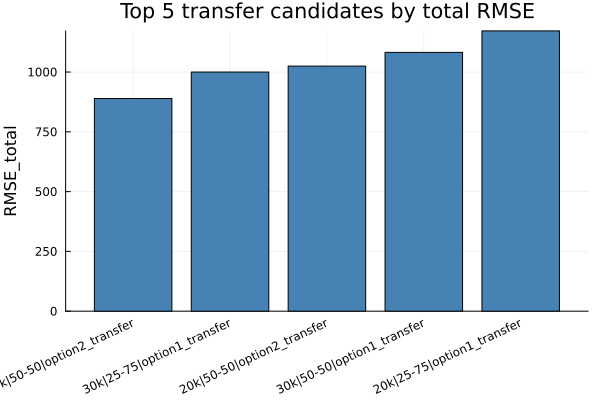

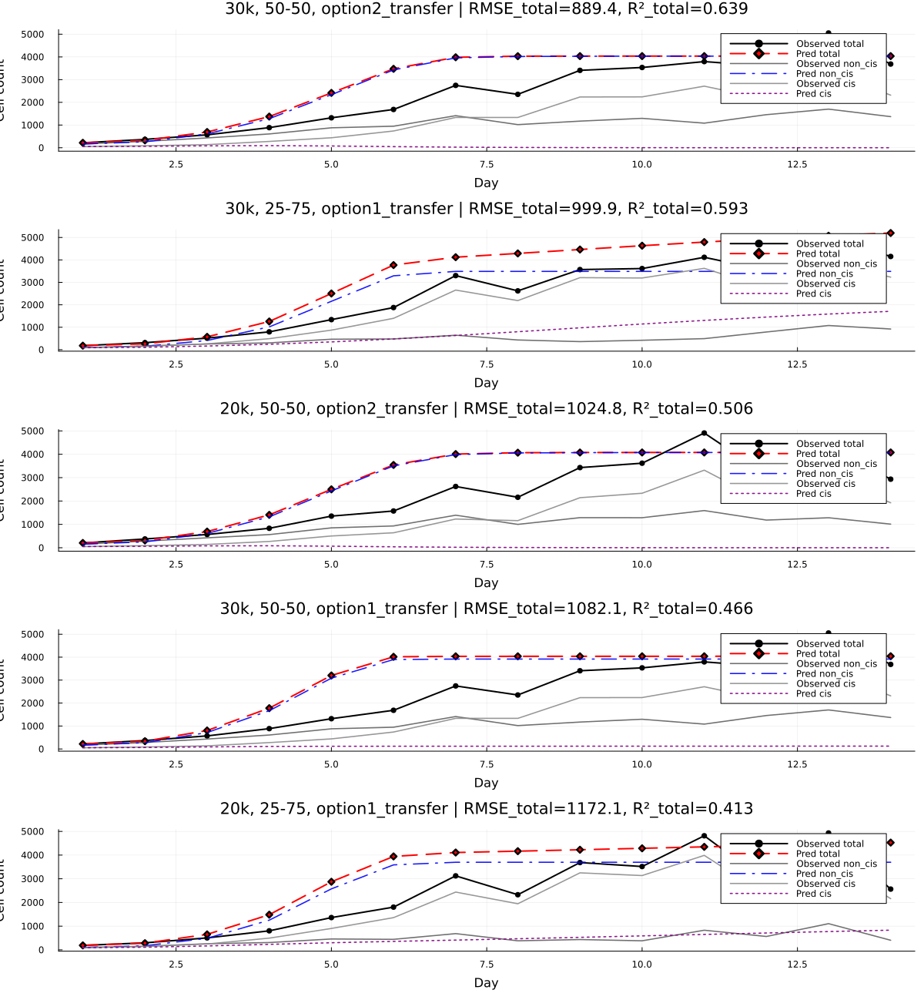

In [31]:
# Plot the expanded transfer-ranking results (top-5)
using Plots
using DataFrames

if !(@isdefined rows_all)
    error("Run the expanded transfer sweep cell first (rows_all is missing).")
end
if !(@isdefined mono)
    error("Run the expanded transfer sweep cell first (mono is missing).")
end
if !(@isdefined opt1)
    error("Run the expanded transfer sweep cell first (opt1 is missing).")
end
if !(@isdefined opt2)
    error("Run the expanded transfer sweep cell first (opt2 is missing).")
end
if !(@isdefined comp)
    error("Run the expanded transfer sweep cell first (comp is missing).")
end
if !(@isdefined treated_root)
    error("Run the expanded transfer sweep cell first (treated_root is missing).")
end

function simulate_transfer_curve(density::String, mix::String, model_name::String)
    obs = load_treated_pair(treated_root, density, mix)
    days = Int.(obs.Day)
    S_obs = Float64.(obs.S_obs)
    R_obs = Float64.(obs.R_obs)
    T_obs = S_obs .+ R_obs

    mono_p = get_mono_params(mono, density)

    if model_name == "option1_transfer"
        r1 = opt1[(opt1.density .== density) .& (opt1.mix_label .== mix), :]
        nrow(r1) == 0 && error("Missing option1 row for $(density), $(mix)")
        p1 = (
            rS = mono_p.rS, KS = mono_p.KS, vS = mono_p.vS,
            rR = mono_p.rR, KR = mono_p.KR, vR = mono_p.vR,
            αSR = Float64(r1.αSR[1]), αRS = Float64(r1.αRS[1])
        )
        S_hat, R_hat = simulate_days(step_opt1, p1, days, S_obs[1], R_obs[1])
    elseif model_name == "option2_transfer"
        r2p = opt2[(opt2.density .== density) .& (opt2.mix_label .== mix), :]
        nrow(r2p) == 0 && error("Missing option2 row for $(density), $(mix)")
        p2 = (
            rS = mono_p.rS, KS = mono_p.KS, vS = mono_p.vS,
            rR = mono_p.rR, KR = mono_p.KR, vR = mono_p.vR,
            αSR = Float64(r2p.αSR[1]), αRS = Float64(r2p.αRS[1]),
            γ = Float64(r2p.γ[1]), δ = Float64(r2p.δ[1])
        )
        S_hat, R_hat = simulate_days(step_opt2, p2, days, S_obs[1], R_obs[1])
    elseif model_name == "competing_transfer"
        rc = comp[(comp.density .== density) .& (comp.mix_label .== mix), :]
        nrow(rc) == 0 && error("Missing competing row for $(density), $(mix)")
        pc = (
            rs = Float64(rc.rs[1]), rr = Float64(rc.rr[1]),
            K = Float64(rc.K[1]), α = Float64(rc.α[1]), β = Float64(rc.β[1])
        )
        S_hat, R_hat = simulate_days(step_competing_sharedK, pc, days, S_obs[1], R_obs[1])
    else
        error("Unknown model name: $(model_name)")
    end

    return DataFrame(
        Day = days,
        S_obs = S_obs, R_obs = R_obs, T_obs = T_obs,
        S_hat = S_hat, R_hat = R_hat, T_hat = S_hat .+ R_hat
    )
end

topN = min(5, nrow(rows_all))
top_total = first(sort(rows_all, :RMSE_total), topN)
display(top_total[:, [:density, :mix, :model, :RMSE_total, :R2_total]])

labels = ["$(r.density)|$(r.mix)|$(r.model)" for r in eachrow(top_total)]
rank_plot = bar(
    1:topN,
    top_total.RMSE_total;
    xticks=(1:topN, labels),
    xrotation=25,
    legend=false,
    color=:steelblue,
    xlabel="Top rank",
    ylabel="RMSE_total",
    title="Top $(topN) transfer candidates by total RMSE"
    )
display(rank_plot)

traj_plot = plot(layout=(topN, 1), size=(1200, 260 * topN), legend=:topright)
for (i, row) in enumerate(eachrow(top_total))
    density = String(row.density)
    mix = String(row.mix)
    model_name = String(row.model)
    d = simulate_transfer_curve(density, mix, model_name)

    plot!(traj_plot[i], d.Day, d.T_obs; marker=:circle, linewidth=2, color=:black, label="Observed total")
    plot!(traj_plot[i], d.Day, d.T_hat; marker=:diamond, linewidth=2, linestyle=:dash, color=:red, label="Pred total")
    plot!(traj_plot[i], d.Day, d.S_obs; linewidth=1.6, color=:gray30, alpha=0.8, label="Observed non_cis")
    plot!(traj_plot[i], d.Day, d.S_hat; linewidth=1.6, linestyle=:dashdot, color=:blue, alpha=0.9, label="Pred non_cis")
    plot!(traj_plot[i], d.Day, d.R_obs; linewidth=1.6, color=:gray55, alpha=0.9, label="Observed cis")
    plot!(traj_plot[i], d.Day, d.R_hat; linewidth=1.6, linestyle=:dot, color=:purple, alpha=0.9, label="Pred cis")

    title!(traj_plot[i], "$(density), $(mix), $(model_name) | RMSE_total=$(round(Float64(row.RMSE_total), digits=1)), R²_total=$(round(Float64(row.R2_total), digits=3))")
    xlabel!(traj_plot[i], "Day")
    ylabel!(traj_plot[i], "Cell count")
end
display(traj_plot)

Treated-aware coculture transfer (with compartment drug kill + delay + exposure decay):

Drug model parameters actually used:


Row,density,mix,model,drug_S,drug_R,RMSE_total,R2_total
,String,String,String,String,String,Float64,Float64
1,20k,25-75,option2_treated_decay,transit_erlang_m4,time_delay,836.743,0.700968
2,20k,50-50,option2_treated_decay,transit_erlang_m4,time_delay,1136.99,0.39214
3,20k,75-25,option2_treated_decay,transit_erlang_m4,time_delay,1408.79,-0.283983
4,30k,25-75,option2_treated_decay,time_delay,theta_hill_kill,2079.91,-0.759061
5,30k,50-50,option2_treated_decay,time_delay,theta_hill_kill,879.097,0.647355
6,30k,75-25,option2_treated_decay,time_delay,theta_hill_kill,353.772,0.92494


Row,density,mix,drug_S,drug_S_params,drug_R,drug_R_params
,String,String,String,String,String,String
1,20k,25-75,transit_erlang_m4,"kmax=3.9788, n=2.651, K50=2.0369, tau=5.5251",time_delay,"alpha=0.873, beta=0.4989, n=5.9986, kD=2.5183"
2,20k,50-50,transit_erlang_m4,"kmax=3.9788, n=2.651, K50=2.0369, tau=5.5251",time_delay,"alpha=0.873, beta=0.4989, n=5.9986, kD=2.5183"
3,20k,75-25,transit_erlang_m4,"kmax=3.9788, n=2.651, K50=2.0369, tau=5.5251",time_delay,"alpha=0.873, beta=0.4989, n=5.9986, kD=2.5183"
4,30k,25-75,time_delay,"alpha=0.2252, beta=0.5, n=1.6709, kD=1.3779",theta_hill_kill,"kmax=3.9293, n=1.9393, K50=8.972"
5,30k,50-50,time_delay,"alpha=0.2252, beta=0.5, n=1.6709, kD=1.3779",theta_hill_kill,"kmax=3.9293, n=1.9393, K50=8.972"
6,30k,75-25,time_delay,"alpha=0.2252, beta=0.5, n=1.6709, kD=1.3779",theta_hill_kill,"kmax=3.9293, n=1.9393, K50=8.972"


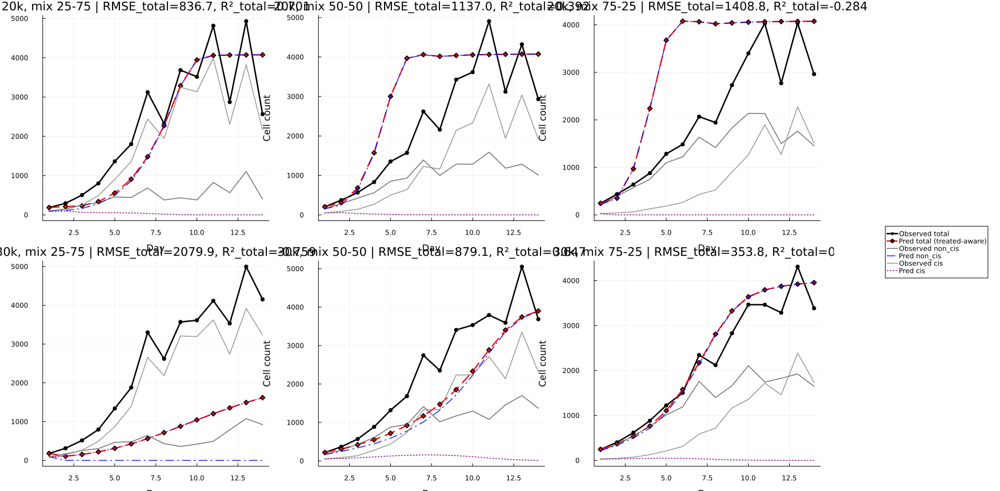

In [32]:
# Treated-aware coculture transfer: add compartment drug kill + delay + exposure decay
using CSV
using DataFrames
using Statistics
using Plots

if !(@isdefined find_project_root) || !(@isdefined get_mono_params) || !(@isdefined load_treated_pair)
    error("Run Cell 6 first (core loaders/functions missing).")
end

project_root = find_project_root()
mono_param_path = joinpath(project_root, "Modeling_Approaches/01_mechanical_manual", "Untreated MonoCulture", "untreated_monoculture_logistic_parameters.csv")
opt2_path = joinpath(project_root, "Modeling_Approaches/01_mechanical_manual", "SimpleModels", "coculture_option2_params.csv")
treated_best_path = joinpath(project_root, "Modeling_Approaches/01_mechanical_manual", "Treated MonoCulture", "outputs", "treated_monoculture_best_models.csv")
treated_bic_path = joinpath(project_root, "Modeling_Approaches/01_mechanical_manual", "Treated MonoCulture", "outputs", "treated_monoculture_model_bic_results.csv")
treated_root = joinpath(project_root, "Processed_Datasets", "Treated Coculture")

mono_local = CSV.read(mono_param_path, DataFrame)
opt2_local = CSV.read(opt2_path, DataFrame)
treated_best = CSV.read(treated_best_path, DataFrame)
treated_bic = CSV.read(treated_bic_path, DataFrame)

function parse_param_map(s::AbstractString)
    d = Dict{String, Float64}()
    for part in split(s, ',')
        kv = split(strip(part), '=')
        if length(kv) == 2
            key = strip(kv[1])
            val = tryparse(Float64, strip(kv[2]))
            if val !== nothing
                d[key] = val
            end
        end
    end
    return d
end

function get_treated_drug_params(best::DataFrame, bic::DataFrame, density::String, cell_line::String)
    rb = best[(best.density .== density) .& (best.cell_line .== cell_line), :]
    row = DataFrame()

    if nrow(rb) > 0
        model_name = String(rb.model[1])
        row = rb[1:1, :]
    else
        preferred = ["theta_hill_kill_dde", "theta_hill_kill", "time_delay", "transit_erlang_m4"]
        for model_name in preferred
            r = bic[(bic.density .== density) .& (bic.cell_line .== cell_line) .& (bic.model .== model_name), :]
            if nrow(r) > 0
                row = r[1:1, :]
                break
            end
        end
    end

    nrow(row) == 0 && error("No treated drug-effect model found for $(density), $(cell_line)")

    model_name = String(row.model[1])
    p = parse_param_map(String(row.params[1]))

    kmax = get(p, "kmax", get(p, "kD", 0.0))
    n = get(p, "n", 1.0)
    K50 = get(p, "K50", 1.0)
    tau = get(p, "tau", get(p, "beta", 0.0))

    return (
        model = model_name,
        kmax = Float64(max(kmax, 0.0)),
        n = Float64(max(n, 1e-6)),
        K50 = Float64(max(K50, 1e-6)),
        tau = Float64(max(tau, 0.0)),
        raw_params = String(row.params[1])
    )
end

hill_rate(dose, kmax, n, K50) = kmax * (dose^n) / (K50^n + dose^n + 1e-12)
smooth_delay(t, tau) = 1.0 / (1.0 + exp(-8.0 * (t - (1.0 + tau))))

function step_opt2_treated(S::Float64, R::Float64, p, t::Float64, dt::Float64)
    αSR = clamp(p.αSR, 0.0, 1.0)
    αRS = clamp(p.αRS, 0.0, 1.0)
    γ = max(p.γ, 0.0)
    δ = max(p.δ, 0.0)

    dose_eff = p.dose0 * exp(-p.k_e * max(t - 1.0, 0.0))

    kS = hill_rate(dose_eff, p.drugS.kmax, p.drugS.n, p.drugS.K50) * smooth_delay(t, p.drugS.tau)
    kR = hill_rate(dose_eff, p.drugR.kmax, p.drugR.n, p.drugR.K50) * smooth_delay(t, p.drugR.tau)

    gS = p.rS * S * clamp_pow(1.0 - (S + γ * R) / p.KS, p.vS) - αSR * S * R - kS * S
    gR = p.rR * R * clamp_pow(1.0 - (δ * S + R) / p.KR, p.vR) - αRS * S * R - kR * R

    S2 = max(S + dt * gS, 0.0)
    R2 = max(R + dt * gR, 0.0)
    return S2, R2
end

function simulate_days_t(stepper, p, days::Vector{Int}, S0::Float64, R0::Float64; dt=0.02, t0=1.0)
    max_day = maximum(days)
    t = t0
    S, R = S0, R0
    out = Dict{Int, Tuple{Float64,Float64}}(Int(round(t0)) => (S0, R0))
    while t < max_day
        S, R = stepper(S, R, p, t, dt)
        t += dt
        d_round = Int(round(t))
        if d_round in days && !haskey(out, d_round)
            out[d_round] = (S, R)
        end
    end
    for d in days
        if !haskey(out, d)
            out[d] = (S, R)
        end
    end
    S_hat = [out[d][1] for d in days]
    R_hat = [out[d][2] for d in days]
    return S_hat, R_hat
end

densities = ["20k", "30k"]
mixes = ["25-75", "50-50", "75-25"]
dose0 = 1.0
k_e = 0.12

treated_rows = DataFrame(density=String[], mix=String[], model=String[], drug_S=String[], drug_R=String[], drug_S_params=String[], drug_R_params=String[], RMSE_S=Float64[], RMSE_R=Float64[], RMSE_total=Float64[], R2_total=Float64[])
treated_plot = DataFrame()

for density in densities, mix in mixes
    obs = load_treated_pair(treated_root, density, mix)
    days = Int.(obs.Day)
    S_obs = Float64.(obs.S_obs)
    R_obs = Float64.(obs.R_obs)
    T_obs = S_obs .+ R_obs

    mono_p = get_mono_params(mono_local, density)
    inter = opt2_local[(opt2_local.density .== density) .& (opt2_local.mix_label .== mix), :]
    nrow(inter) == 0 && error("Missing option2 interaction params for $(density), $(mix)")

    drugS = get_treated_drug_params(treated_best, treated_bic, density, "A2780Naive")
    drugR = get_treated_drug_params(treated_best, treated_bic, density, "A2780cis")

    p = (
        rS = mono_p.rS, KS = mono_p.KS, vS = mono_p.vS,
        rR = mono_p.rR, KR = mono_p.KR, vR = mono_p.vR,
        αSR = Float64(inter.αSR[1]), αRS = Float64(inter.αRS[1]),
        γ = Float64(inter.γ[1]), δ = Float64(inter.δ[1]),
        drugS = drugS, drugR = drugR, dose0 = dose0, k_e = k_e
    )

    S_hat, R_hat = simulate_days_t(step_opt2_treated, p, days, S_obs[1], R_obs[1])
    T_hat = S_hat .+ R_hat

    push!(treated_rows, (
        density, mix, "option2_treated_decay",
        String(drugS.model), String(drugR.model), String(drugS.raw_params), String(drugR.raw_params),
        rmse(S_obs,S_hat), rmse(R_obs,R_hat), rmse(T_obs,T_hat), r2(T_obs,T_hat)
    ))

    append!(treated_plot, DataFrame(
        density=fill(density, length(days)), mix=fill(mix, length(days)), Day=days,
        S_obs=S_obs, R_obs=R_obs, T_obs=T_obs, S_hat=S_hat, R_hat=R_hat, T_hat=T_hat
    ))
end

println("Treated-aware coculture transfer (with compartment drug kill + delay + exposure decay):")
display(sort(treated_rows[:, [:density, :mix, :model, :drug_S, :drug_R, :RMSE_total, :R2_total]], [:density, :mix]))

println("\nDrug model parameters actually used:")
display(sort(treated_rows[:, [:density, :mix, :drug_S, :drug_S_params, :drug_R, :drug_R_params]], [:density, :mix]))

# 6 data panels without legends
plt_treated = plot(layout=(2,3), size=(1400, 860), legend=false)
panel = 1
for density in densities, mix in mixes
    d = treated_plot[(treated_plot.density .== density) .& (treated_plot.mix .== mix), :]
    sort!(d, :Day)
    m = treated_rows[(treated_rows.density .== density) .& (treated_rows.mix .== mix), :]

    plot!(plt_treated[panel], d.Day, d.T_obs; marker=:circle, linewidth=2.5, color=:black, label="Observed total")
    plot!(plt_treated[panel], d.Day, d.T_hat; marker=:diamond, linewidth=2.2, linestyle=:dash, color=:red, label="Pred total (treated-aware)")
    plot!(plt_treated[panel], d.Day, d.S_obs; linewidth=1.5, color=:gray30, alpha=0.8, label="Observed non_cis")
    plot!(plt_treated[panel], d.Day, d.S_hat; linewidth=1.5, linestyle=:dashdot, color=:blue, alpha=0.9, label="Pred non_cis")
    plot!(plt_treated[panel], d.Day, d.R_obs; linewidth=1.5, color=:gray55, alpha=0.9, label="Observed cis")
    plot!(plt_treated[panel], d.Day, d.R_hat; linewidth=1.5, linestyle=:dot, color=:purple, alpha=0.9, label="Pred cis")

    title!(plt_treated[panel], "$(density), mix $(mix) | RMSE_total=$(round(Float64(m.RMSE_total[1]), digits=1)), R²_total=$(round(Float64(m.R2_total[1]), digits=3))")
    xlabel!(plt_treated[panel], "Day")
    ylabel!(plt_treated[panel], "Cell count")
    panel += 1
end

# Standalone legend panel (outside data area)
legend_panel = plot(
    framestyle=:none,
    xlims=(0,1), ylims=(0,1),
    xticks=false, yticks=false,
    legend=:right
    )
plot!(legend_panel, [NaN], [NaN]; marker=:circle, linewidth=2.5, color=:black, label="Observed total")
plot!(legend_panel, [NaN], [NaN]; marker=:diamond, linewidth=2.2, linestyle=:dash, color=:red, label="Pred total (treated-aware)")
plot!(legend_panel, [NaN], [NaN]; linewidth=1.5, color=:gray30, alpha=0.8, label="Observed non_cis")
plot!(legend_panel, [NaN], [NaN]; linewidth=1.5, linestyle=:dashdot, color=:blue, alpha=0.9, label="Pred non_cis")
plot!(legend_panel, [NaN], [NaN]; linewidth=1.5, color=:gray55, alpha=0.9, label="Observed cis")
plot!(legend_panel, [NaN], [NaN]; linewidth=1.5, linestyle=:dot, color=:purple, alpha=0.9, label="Pred cis")

final_plot = plot(
    plt_treated, legend_panel;
    layout=@layout([a{0.83w} b{0.17w}]),
    size=(1750, 860)
    )
display(final_plot)

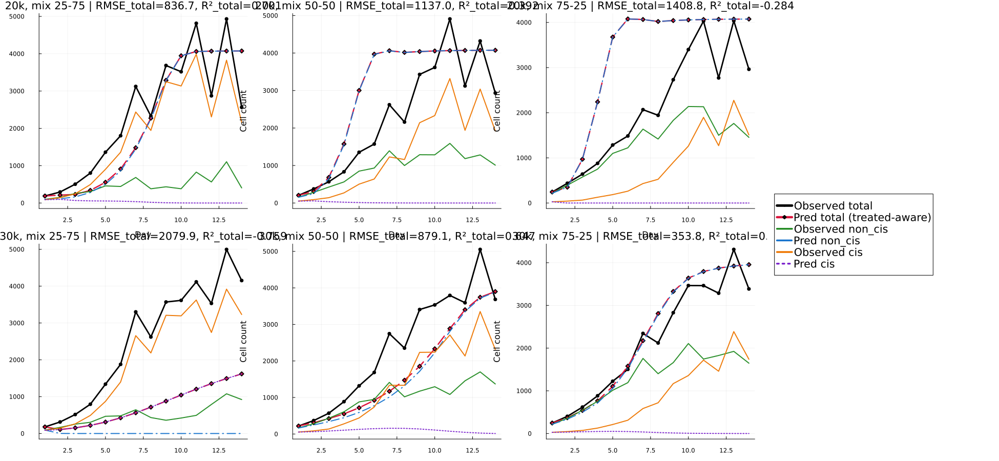

In [33]:
# Styled treated-aware plot: richer colors + larger external legend
using Plots
using DataFrames

if !(@isdefined treated_plot) || !(@isdefined treated_rows) || !(@isdefined densities) || !(@isdefined mixes)
    error("Run Cell 9 first so treated_plot/treated_rows are available.")
end

series_colors = Dict(
    :obs_total => :black,
    :pred_total => :crimson,
    :obs_noncis => :forestgreen,
    :pred_noncis => :dodgerblue3,
    :obs_cis => :darkorange2,
    :pred_cis => :purple3
 )

plt_styled = plot(layout=(2,3), size=(1450, 880), legend=false)
panel = 1
for density in densities, mix in mixes
    d = treated_plot[(treated_plot.density .== density) .& (treated_plot.mix .== mix), :]
    sort!(d, :Day)
    m = treated_rows[(treated_rows.density .== density) .& (treated_rows.mix .== mix), :]

    plot!(plt_styled[panel], d.Day, d.T_obs; marker=:circle, markersize=4, linewidth=2.8, color=series_colors[:obs_total], label="Observed total")
    plot!(plt_styled[panel], d.Day, d.T_hat; marker=:diamond, markersize=4, linewidth=2.5, linestyle=:dash, color=series_colors[:pred_total], label="Pred total (treated-aware)")
    plot!(plt_styled[panel], d.Day, d.S_obs; linewidth=2.0, color=series_colors[:obs_noncis], alpha=0.95, label="Observed non_cis")
    plot!(plt_styled[panel], d.Day, d.S_hat; linewidth=2.0, linestyle=:dashdot, color=series_colors[:pred_noncis], alpha=0.95, label="Pred non_cis")
    plot!(plt_styled[panel], d.Day, d.R_obs; linewidth=2.0, color=series_colors[:obs_cis], alpha=0.95, label="Observed cis")
    plot!(plt_styled[panel], d.Day, d.R_hat; linewidth=2.0, linestyle=:dot, color=series_colors[:pred_cis], alpha=0.95, label="Pred cis")

    title!(plt_styled[panel], "$(density), mix $(mix) | RMSE_total=$(round(Float64(m.RMSE_total[1]), digits=1)), R²_total=$(round(Float64(m.R2_total[1]), digits=3))")
    xlabel!(plt_styled[panel], "Day")
    ylabel!(plt_styled[panel], "Cell count")
    panel += 1
end

legend_panel_big = plot(
    framestyle=:none,
    xlims=(0,1), ylims=(0,1),
    xticks=false, yticks=false,
    legend=:left,
    legendfontsize=14
 )
plot!(legend_panel_big, [NaN], [NaN]; marker=:circle, markersize=6, linewidth=2.8, color=series_colors[:obs_total], label="Observed total")
plot!(legend_panel_big, [NaN], [NaN]; marker=:diamond, markersize=6, linewidth=2.5, linestyle=:dash, color=series_colors[:pred_total], label="Pred total (treated-aware)")
plot!(legend_panel_big, [NaN], [NaN]; linewidth=2.0, color=series_colors[:obs_noncis], label="Observed non_cis")
plot!(legend_panel_big, [NaN], [NaN]; linewidth=2.0, linestyle=:dashdot, color=series_colors[:pred_noncis], label="Pred non_cis")
plot!(legend_panel_big, [NaN], [NaN]; linewidth=2.0, color=series_colors[:obs_cis], label="Observed cis")
plot!(legend_panel_big, [NaN], [NaN]; linewidth=2.0, linestyle=:dot, color=series_colors[:pred_cis], label="Pred cis")

final_styled = plot(
    plt_styled, legend_panel_big;
    layout=@layout([a{0.76w} b{0.24w}]),
    size=(1950, 900)
 )
display(final_styled)

Transfer-vs-fit metrics:


Row,density,mix,version,scaleS,scaleR,RMSE_S,RMSE_R,RMSE_total,R2_total
,String,String,String,Float64,Float64,Float64,Float64,Float64,Float64
1,20k,25-75,fit_on_coculture,2.5,1.2,2366.53,2288.64,725.545,0.775166
2,20k,25-75,transfer_predict,1.0,1.0,2237.27,2283.73,836.743,0.700968
3,20k,50-50,fit_on_coculture,2.5,0.2,2250.16,1713.99,1020.4,0.510411
4,20k,50-50,transfer_predict,1.0,1.0,2358.5,1717.23,1136.99,0.39214
5,20k,75-25,fit_on_coculture,2.5,0.2,2046.95,1057.34,1375.37,-0.223793
6,20k,75-25,transfer_predict,1.0,1.0,2086.45,1057.34,1408.79,-0.283983
7,30k,25-75,fit_on_coculture,0.2,0.2,561.702,1507.07,2023.12,-0.664324
8,30k,25-75,transfer_predict,1.0,1.0,561.703,1563.44,2079.91,-0.759061
9,30k,50-50,fit_on_coculture,0.6,0.2,1714.1,1728.0,378.941,0.934475


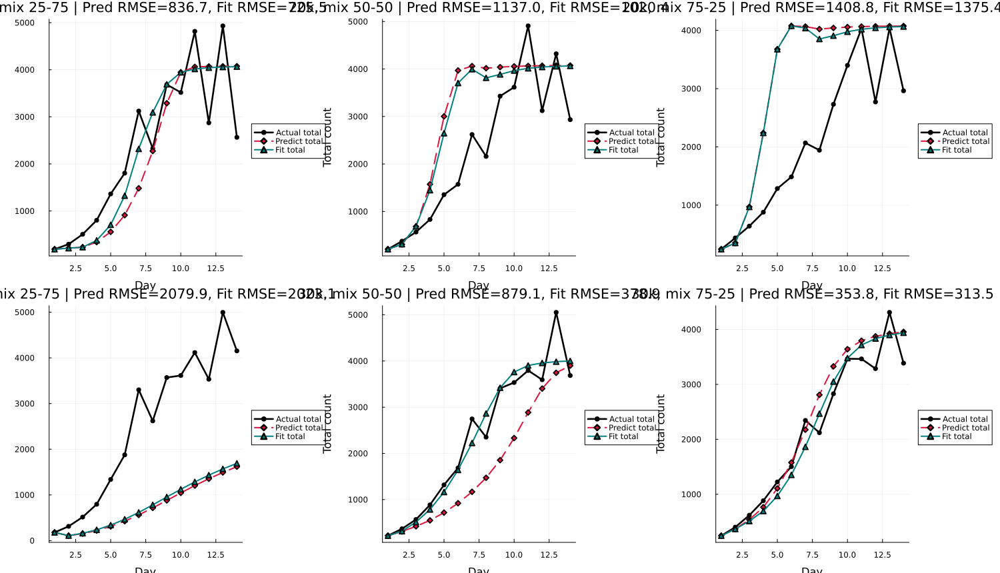

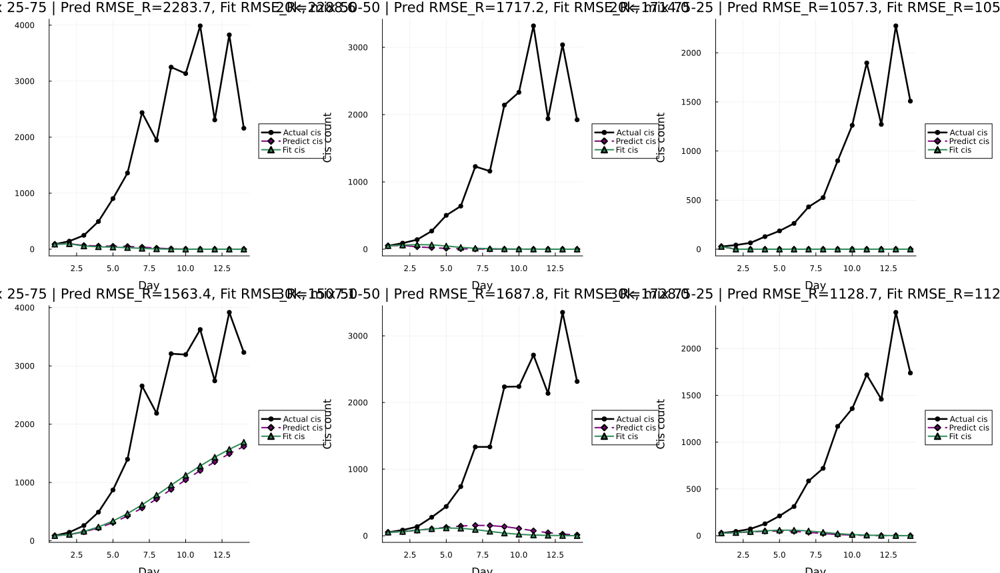

In [34]:
# Transfer-vs-fit comparison: prediction model vs fitted model vs actual
using DataFrames
using Statistics
using Plots

if !(@isdefined mono_local) || !(@isdefined opt2_local) || !(@isdefined treated_best) || !(@isdefined treated_bic)
    error("Run Cell 9 first so parameter tables and helper functions are loaded.")
end

densities_cmp = ["20k", "30k"]
mixes_cmp = ["25-75", "50-50", "75-25"]

function step_opt2_treated_scaled(S::Float64, R::Float64, p, t::Float64, dt::Float64, scaleS::Float64, scaleR::Float64)
    αSR = clamp(p.αSR, 0.0, 1.0)
    αRS = clamp(p.αRS, 0.0, 1.0)
    γ = max(p.γ, 0.0)
    δ = max(p.δ, 0.0)

    dose_eff = p.dose0 * exp(-p.k_e * max(t - 1.0, 0.0))
    kS = scaleS * hill_rate(dose_eff, p.drugS.kmax, p.drugS.n, p.drugS.K50) * smooth_delay(t, p.drugS.tau)
    kR = scaleR * hill_rate(dose_eff, p.drugR.kmax, p.drugR.n, p.drugR.K50) * smooth_delay(t, p.drugR.tau)

    gS = p.rS * S * clamp_pow(1.0 - (S + γ * R) / p.KS, p.vS) - αSR * S * R - kS * S
    gR = p.rR * R * clamp_pow(1.0 - (δ * S + R) / p.KR, p.vR) - αRS * S * R - kR * R

    S2 = max(S + dt * gS, 0.0)
    R2 = max(R + dt * gR, 0.0)
    return S2, R2
end

function simulate_days_t_scaled(p, days::Vector{Int}, S0::Float64, R0::Float64, scaleS::Float64, scaleR::Float64; dt=0.02, t0=1.0)
    max_day = maximum(days)
    t = t0
    S, R = S0, R0
    out = Dict{Int, Tuple{Float64,Float64}}(Int(round(t0)) => (S0, R0))
    while t < max_day
        S, R = step_opt2_treated_scaled(S, R, p, t, dt, scaleS, scaleR)
        t += dt
        d_round = Int(round(t))
        if d_round in days && !haskey(out, d_round)
            out[d_round] = (S, R)
        end
    end
    for d in days
        if !haskey(out, d)
            out[d] = (S, R)
        end
    end
    S_hat = [out[d][1] for d in days]
    R_hat = [out[d][2] for d in days]
    return S_hat, R_hat
end

compare_rows = DataFrame(
    density=String[], mix=String[], version=String[],
    scaleS=Float64[], scaleR=Float64[],
    RMSE_S=Float64[], RMSE_R=Float64[], RMSE_total=Float64[],
    R2_S=Float64[], R2_R=Float64[], R2_total=Float64[]
 )
curve_rows = DataFrame()

for density in densities_cmp, mix in mixes_cmp
    obs = load_treated_pair(treated_root, density, mix)
    days = Int.(obs.Day)
    S_obs = Float64.(obs.S_obs)
    R_obs = Float64.(obs.R_obs)
    T_obs = S_obs .+ R_obs

    mono_p = get_mono_params(mono_local, density)
    inter = opt2_local[(opt2_local.density .== density) .& (opt2_local.mix_label .== mix), :]
    nrow(inter) == 0 && error("Missing option2 interaction params for $(density), $(mix)")

    drugS = get_treated_drug_params(treated_best, treated_bic, density, "A2780Naive")
    drugR = get_treated_drug_params(treated_best, treated_bic, density, "A2780cis")

    p = (
        rS = mono_p.rS, KS = mono_p.KS, vS = mono_p.vS,
        rR = mono_p.rR, KR = mono_p.KR, vR = mono_p.vR,
        αSR = Float64(inter.αSR[1]), αRS = Float64(inter.αRS[1]),
        γ = Float64(inter.γ[1]), δ = Float64(inter.δ[1]),
        drugS = drugS, drugR = drugR, dose0 = dose0, k_e = k_e
    )

    # Transfer prediction (no fit)
    S_hat_tr, R_hat_tr = simulate_days_t_scaled(p, days, S_obs[1], R_obs[1], 1.0, 1.0)
    T_hat_tr = S_hat_tr .+ R_hat_tr
    push!(compare_rows, (density, mix, "transfer_predict", 1.0, 1.0, rmse(S_obs,S_hat_tr), rmse(R_obs,R_hat_tr), rmse(T_obs,T_hat_tr), r2(S_obs,S_hat_tr), r2(R_obs,R_hat_tr), r2(T_obs,T_hat_tr)))
    append!(curve_rows, DataFrame(density=fill(density,length(days)), mix=fill(mix,length(days)), version=fill("transfer_predict",length(days)), Day=days, S_obs=S_obs, R_obs=R_obs, T_obs=T_obs, S_hat=S_hat_tr, R_hat=R_hat_tr, T_hat=T_hat_tr))

    # Fitted version: fit scaleS/scaleR on coculture
    scale_grid = collect(0.2:0.1:2.5)
    best_obj = Inf
    best_scaleS, best_scaleR = 1.0, 1.0
    best_S = S_hat_tr
    best_R = R_hat_tr

    for sS in scale_grid, sR in scale_grid
        S_hat, R_hat = simulate_days_t_scaled(p, days, S_obs[1], R_obs[1], sS, sR)
        T_hat = S_hat .+ R_hat
        obj = rmse(T_obs, T_hat) + 0.35 * rmse(R_obs, R_hat) + 0.15 * rmse(S_obs, S_hat)
        if obj < best_obj
            best_obj = obj
            best_scaleS, best_scaleR = sS, sR
            best_S, best_R = S_hat, R_hat
        end
    end

    best_T = best_S .+ best_R
    push!(compare_rows, (density, mix, "fit_on_coculture", best_scaleS, best_scaleR, rmse(S_obs,best_S), rmse(R_obs,best_R), rmse(T_obs,best_T), r2(S_obs,best_S), r2(R_obs,best_R), r2(T_obs,best_T)))
    append!(curve_rows, DataFrame(density=fill(density,length(days)), mix=fill(mix,length(days)), version=fill("fit_on_coculture",length(days)), Day=days, S_obs=S_obs, R_obs=R_obs, T_obs=T_obs, S_hat=best_S, R_hat=best_R, T_hat=best_T))
end

println("Transfer-vs-fit metrics:")
display(sort(compare_rows[:, [:density,:mix,:version,:scaleS,:scaleR,:RMSE_S,:RMSE_R,:RMSE_total,:R2_total]], [:density,:mix,:version]))

# Plot 1: TOTAL comparison (actual vs transfer vs fit)
plt_total = plot(layout=(2,3), size=(1500, 860), legend=:outerright)
panel = 1
for density in densities_cmp, mix in mixes_cmp
    obs = curve_rows[(curve_rows.density .== density) .& (curve_rows.mix .== mix) .& (curve_rows.version .== "transfer_predict"), :]
    tr = curve_rows[(curve_rows.density .== density) .& (curve_rows.mix .== mix) .& (curve_rows.version .== "transfer_predict"), :]
    ft = curve_rows[(curve_rows.density .== density) .& (curve_rows.mix .== mix) .& (curve_rows.version .== "fit_on_coculture"), :]
    sort!(obs, :Day); sort!(tr, :Day); sort!(ft, :Day)

    m_tr = compare_rows[(compare_rows.density .== density) .& (compare_rows.mix .== mix) .& (compare_rows.version .== "transfer_predict"), :]
    m_ft = compare_rows[(compare_rows.density .== density) .& (compare_rows.mix .== mix) .& (compare_rows.version .== "fit_on_coculture"), :]

    plot!(plt_total[panel], obs.Day, obs.T_obs; marker=:circle, linewidth=2.6, color=:black, label="Actual total")
    plot!(plt_total[panel], tr.Day, tr.T_hat; marker=:diamond, linewidth=2.0, linestyle=:dash, color=:crimson, label="Predict total")
    plot!(plt_total[panel], ft.Day, ft.T_hat; marker=:utriangle, linewidth=2.0, linestyle=:solid, color=:teal, label="Fit total")
    title!(plt_total[panel], "$(density), mix $(mix) | Pred RMSE=$(round(Float64(m_tr.RMSE_total[1]),digits=1)), Fit RMSE=$(round(Float64(m_ft.RMSE_total[1]),digits=1))")
    xlabel!(plt_total[panel], "Day")
    ylabel!(plt_total[panel], "Total count")
    panel += 1
end
display(plt_total)

# Plot 2: CIS comparison (actual vs transfer vs fit)
plt_cis = plot(layout=(2,3), size=(1500, 860), legend=:outerright)
panel = 1
for density in densities_cmp, mix in mixes_cmp
    obs = curve_rows[(curve_rows.density .== density) .& (curve_rows.mix .== mix) .& (curve_rows.version .== "transfer_predict"), :]
    tr = curve_rows[(curve_rows.density .== density) .& (curve_rows.mix .== mix) .& (curve_rows.version .== "transfer_predict"), :]
    ft = curve_rows[(curve_rows.density .== density) .& (curve_rows.mix .== mix) .& (curve_rows.version .== "fit_on_coculture"), :]
    sort!(obs, :Day); sort!(tr, :Day); sort!(ft, :Day)

    m_tr = compare_rows[(compare_rows.density .== density) .& (compare_rows.mix .== mix) .& (compare_rows.version .== "transfer_predict"), :]
    m_ft = compare_rows[(compare_rows.density .== density) .& (compare_rows.mix .== mix) .& (compare_rows.version .== "fit_on_coculture"), :]

    plot!(plt_cis[panel], obs.Day, obs.R_obs; marker=:circle, linewidth=2.6, color=:black, label="Actual cis")
    plot!(plt_cis[panel], tr.Day, tr.R_hat; marker=:diamond, linewidth=2.0, linestyle=:dash, color=:purple, label="Predict cis")
    plot!(plt_cis[panel], ft.Day, ft.R_hat; marker=:utriangle, linewidth=2.0, linestyle=:solid, color=:seagreen, label="Fit cis")
    title!(plt_cis[panel], "$(density), mix $(mix) | Pred RMSE_R=$(round(Float64(m_tr.RMSE_R[1]),digits=1)), Fit RMSE_R=$(round(Float64(m_ft.RMSE_R[1]),digits=1))")
    xlabel!(plt_cis[panel], "Day")
    ylabel!(plt_cis[panel], "Cis count")
    panel += 1
end
display(plt_cis)

## Standardized Parameter Export
Run this cell to build one standardized parameter table at `Processed_Datasets/standardized_parameters.csv`.

In [35]:
# Export representative treated coculture outputs (CSVs + images)
using CSV, DataFrames, Dates, Plots

if !(@isdefined find_project_root)
    error("Run Cell 6 first (find_project_root is missing).")
end

project_root = find_project_root()
nb_root = joinpath(project_root, "Modeling_Approaches/01_mechanical_manual", "Treated Coculture")
out_csv = joinpath(nb_root, "outputs", "csv")
out_img = joinpath(nb_root, "outputs", "images")
mkpath(out_csv)
mkpath(out_img)

timestamp = Dates.format(now(), "yyyy-mm-dd HH:MM:SS")

saved_csv = String[]
saved_img = String[]

function save_df_if_defined(var_sym::Symbol, filename::String, saved_csv::Vector{String}, out_csv::String)
    if isdefined(Main, var_sym)
        df = getfield(Main, var_sym)
        if df isa DataFrame && nrow(df) > 0
            path = joinpath(out_csv, filename)
            CSV.write(path, df)
            push!(saved_csv, path)
        end
    end
end

function save_plot_if_defined(var_sym::Symbol, filename::String, saved_img::Vector{String}, out_img::String)
    if isdefined(Main, var_sym)
        plt = getfield(Main, var_sym)
        path = joinpath(out_img, filename)
        savefig(plt, path)
        push!(saved_img, path)
    end
end

# Core summary tables
save_df_if_defined(:rows_all, "treated_coculture_transfer_all_models.csv", saved_csv, out_csv)
save_df_if_defined(:treated_rows, "treated_coculture_treated_aware_summary.csv", saved_csv, out_csv)
save_df_if_defined(:treated_plot, "treated_coculture_treated_aware_curves.csv", saved_csv, out_csv)
save_df_if_defined(:compare_rows, "treated_coculture_transfer_vs_fit_metrics.csv", saved_csv, out_csv)
save_df_if_defined(:curve_rows, "treated_coculture_transfer_vs_fit_curves.csv", saved_csv, out_csv)

# Best/top tables derived from rows_all
if isdefined(Main, :rows_all)
    rows_all_df = getfield(Main, :rows_all)
    if rows_all_df isa DataFrame && nrow(rows_all_df) > 0
        top_total_export = first(sort(rows_all_df, :RMSE_total), min(10, nrow(rows_all_df)))
        CSV.write(joinpath(out_csv, "treated_coculture_top_transfer_candidates_by_total_rmse.csv"), top_total_export)
        push!(saved_csv, joinpath(out_csv, "treated_coculture_top_transfer_candidates_by_total_rmse.csv"))

        best_by_condition = combine(groupby(rows_all_df, [:density, :mix]), :RMSE_total => minimum => :best_rmse_total)
        best_by_condition = innerjoin(rows_all_df, best_by_condition, on=[:density, :mix])
        best_by_condition = best_by_condition[best_by_condition.RMSE_total .== best_by_condition.best_rmse_total, :]
        best_by_condition = sort(best_by_condition[:, [:density, :mix, :model, :RMSE_S, :RMSE_R, :RMSE_total, :R2_total]], [:density, :mix])
        CSV.write(joinpath(out_csv, "treated_coculture_best_transfer_per_condition.csv"), best_by_condition)
        push!(saved_csv, joinpath(out_csv, "treated_coculture_best_transfer_per_condition.csv"))
    end
end

# Representative figures produced in previous cells
save_plot_if_defined(:rank_plot, "treated_coculture_top_transfer_rank_bar.png", saved_img, out_img)
save_plot_if_defined(:traj_plot, "treated_coculture_top_transfer_trajectories.png", saved_img, out_img)
save_plot_if_defined(:final_plot, "treated_coculture_treated_aware_panels_with_legend.png", saved_img, out_img)
save_plot_if_defined(:final_styled, "treated_coculture_treated_aware_styled_panels.png", saved_img, out_img)
save_plot_if_defined(:plt_total, "treated_coculture_transfer_vs_fit_total.png", saved_img, out_img)
save_plot_if_defined(:plt_cis, "treated_coculture_transfer_vs_fit_cis.png", saved_img, out_img)

manifest_rows = DataFrame(
    generated_at = fill(timestamp, length(saved_csv) + length(saved_img)),
    file_type = vcat(fill("csv", length(saved_csv)), fill("image", length(saved_img))),
    path = vcat(saved_csv, saved_img)
 )
if nrow(manifest_rows) > 0
    CSV.write(joinpath(out_csv, "treated_coculture_output_manifest.csv"), manifest_rows)
    push!(saved_csv, joinpath(out_csv, "treated_coculture_output_manifest.csv"))
end

println("Saved CSV files:")
for p in saved_csv
    println("  - " * p)
end
println("\nSaved image files:")
for p in saved_img
    println("  - " * p)
end

DataFrame(
    saved_csv_count = [length(saved_csv)],
    saved_image_count = [length(saved_img)],
    csv_dir = [out_csv],
    image_dir = [out_img]
 )

Saved CSV files:
  - /home/kadin/Desktop/Research/CancerGrowthDynamics/Modeling_Approaches/01_mechanical_manual/Treated Coculture/outputs/csv/treated_coculture_transfer_all_models.csv
  - /home/kadin/Desktop/Research/CancerGrowthDynamics/Modeling_Approaches/01_mechanical_manual/Treated Coculture/outputs/csv/treated_coculture_treated_aware_summary.csv
  - /home/kadin/Desktop/Research/CancerGrowthDynamics/Modeling_Approaches/01_mechanical_manual/Treated Coculture/outputs/csv/treated_coculture_treated_aware_curves.csv
  - /home/kadin/Desktop/Research/CancerGrowthDynamics/Modeling_Approaches/01_mechanical_manual/Treated Coculture/outputs/csv/treated_coculture_transfer_vs_fit_metrics.csv
  - /home/kadin/Desktop/Research/CancerGrowthDynamics/Modeling_Approaches/01_mechanical_manual/Treated Coculture/outputs/csv/treated_coculture_transfer_vs_fit_curves.csv
  - /home/kadin/Desktop/Research/CancerGrowthDynamics/Modeling_Approaches/01_mechanical_manual/Treated Coculture/outputs/csv/treated_cocul

Row,saved_csv_count,saved_image_count,csv_dir,image_dir
,Int64,Int64,String,String
1,8,6,/home/kadin/Desktop/Research/CancerGrowthDynamics/Modeling_Approaches/01_mechanical_manual/Treated Coculture/outputs/csv,/home/kadin/Desktop/Research/CancerGrowthDynamics/Modeling_Approaches/01_mechanical_manual/Treated Coculture/outputs/images
